In [1]:
DEBUG = False

In [2]:
import sys
sys.path.append('../HPA-competition-solutions/bestfitting/src/')

In [3]:
import time
import skimage.io
import numpy as np
import pandas as pd
import cv2
import PIL.Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SubsetRandomSampler, RandomSampler, SequentialSampler
from warmup_scheduler import GradualWarmupScheduler
from efficientnet_pytorch import model as enet
import albumentations
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score
from tqdm import tqdm_notebook as tqdm
import os
import warnings
import cv2
from sklearn.metrics import average_precision_score
import pickle

warnings.filterwarnings('ignore') 

In [4]:
from config.config import *
from networks.densenet import *
from datasets.tool import *
from torch.utils.data import Dataset
import pandas as pd
import torchvision
import torch
import cv2
import os

import time
import shutil
from sklearn.metrics import f1_score

import torch
import torch.optim
from torch.utils.data import DataLoader
from torch.utils.data.sampler import RandomSampler, SequentialSampler
from torch.nn import DataParallel
from torch.backends import cudnn
import torch.nn.functional as F
from torch.autograd import Variable

from config.config import *
from utils.common_util import *
from networks.imageclsnet import init_network
from datasets.protein_dataset import ProteinDataset
from utils.augment_util import train_multi_augment2
from layers.loss import *
from layers.scheduler import *
from utils.log_util import Logger

run on pazur


In [5]:
kernel_type = 'bf_6'

fold = 0
image_size = 768
crop_size = 768
batch_size = 16
num_workers = 8
out_dim = 19
init_lr = 3e-4
warmup_factor = 10
nseed = 2 if DEBUG else 5
nfold = 2 if DEBUG else 5
seed = 42
test_image_size = 128

warmup_epo = 1
n_epochs = 3 if DEBUG else 3

device = torch.device('cuda')

## Model

In [6]:
dm = torchvision.models.densenet121(pretrained=True)

In [7]:
def get_model_test():
    model = class_densenet121_dropout(num_classes=19, in_channels=4, pretrained_file='/home/darek/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth')
    return model

## Augmentations

In [24]:
def get_cell(img, cell_mask, cell):
    imsize = img.shape[1]
    bmask = cell_mask == cell
    bmask_cell = bmask.astype(int)[...,None]
    masked_img = img * bmask_cell
    true_points = np.argwhere(bmask_cell)
    top_left = true_points.min(axis=0)
    bottom_right = true_points.max(axis=0)
    x0, y0 = top_left[:2]
    x1, y1 = bottom_right[:2]
    
    choices = []
    if x0+512 <= imsize and y0+512 <= imsize: choices.append(1)
    if x1-512 >= 0 and y0+512 <= imsize: choices.append(2)
    if x0+512 <= imsize and y1-512 >= 0: choices.append(3)
    if x1-512 >= 0 and y1-512 >= 0: choices.append(4)
        
    if len(choices) == 3: choices = choices + [choices[0]]    
    if len(choices) == 2: choices = choices * 2
    if len(choices) == 1: choices = choices * 4    
        
    template = []
    
    for corner in choices:              
        if corner == 1: template.append(masked_img[x0:x0+512, y0:y0+512])
        if corner == 2: template.append(masked_img[x1-512:x1, y0:y0+512])
        if corner == 3: template.append(masked_img[x0:x0+512, y1-512:y1])
        if corner == 4: template.append(masked_img[x1-512:x1, y1-512:y1])
            
    row1 = np.concatenate(template[:2],axis=0)
    row2 = np.concatenate(template[2:],axis=0)
    o = np.concatenate([row1,row2],axis=1)

    cropped_arr = cv2.resize(o, (384,384))

    return cropped_arr

In [25]:
def read_rgby_test(img_id):
    img_dir = '../full_test/test'
    msk_dir = '../test_masks/work/cell_masks'
    suffix = '.png'
    colors = ['red', 'green', 'blue', 'yellow']
    flags = cv2.IMREAD_GRAYSCALE
    img = [cv2.imread(opj(img_dir, img_id + '_' + color + suffix), flags)
           for color in colors]
    img = np.stack(img, axis=-1)
    msk = np.load(opj(msk_dir, img_id + '.npz'))['arr_0'].astype(np.uint8)
    return img, msk

In [26]:
mean = (0.07237246, 0.04476176, 0.07661699)
std = (0.17179589, 0.10284516, 0.14199627)


transforms_train = albumentations.Compose([
    albumentations.Resize(image_size, image_size, p=1.),
    albumentations.RandomCrop(crop_size, crop_size, p=1.),
    albumentations.VerticalFlip(p=0.5),
    albumentations.HorizontalFlip(p=0.5),
    albumentations.RandomRotate90(p=0.5),
#     albumentations.RandomGridShuffle(grid=(3, 3), p=0.25),
#     albumentations.Normalize(mean=mean, std=std)
])

transforms_val = albumentations.Compose([
    albumentations.Resize(image_size, image_size, p=1.),
#     albumentations.RandomCrop(crop_size, crop_size, p=1.),
#     albumentations.Normalize(mean=mean, std=std)
])

transforms_test = albumentations.Compose([
    albumentations.LongestMaxSize(max_size=int(test_image_size)),
    albumentations.PadIfNeeded(min_height=int(test_image_size * 1.25), min_width=int(test_image_size * 1.25)),
#     albumentations.Normalize(mean=mean, std=std, max_pixel_value=255.0)
])


In [27]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std
    def __call__(self, tensor):
#         for t, m, s in zip(tensor, self.mean, self.std):
#             t.mul_(s).add_(m)
        return tensor

In [28]:
def tensor2label(t):
    l = t.numpy().tolist()
    l = [i for i,v in enumerate(l) if v==1.]
    return str(l)
label = torch.tensor(np.array([1.,0,1,0]))
tensor2label(label)

'[0, 2]'

In [29]:
unnorm = UnNormalize(mean, std)

## Test Inference

In [30]:
import random

In [31]:
test_image_folder = '/media/darek/projects/hpa/testrgby/test_cells/test_cells'
test_df = pd.read_csv('/media/darek/projects/hpa/testrgby/test_cell_df.csv')
test_df.head()

# test_df = test_df.sample(100, random_state=42).reset_index(drop=True)

,image_id,cell_id,size1,size2,enc
0,0040581b-f1f2-4fbe-b043-b6bfea5404bb,1,342,1050,eNqtVm2PojAQ/ksMZe+Sy21yubtc4gKDIkpBUJQ3KyD//9...
1,0040581b-f1f2-4fbe-b043-b6bfea5404bb,2,762,680,eNrVUm1PwkAM/kvt3XgRjEajvO7uhGCEEHCgcSQi/v9vXt...
2,0040581b-f1f2-4fbe-b043-b6bfea5404bb,3,398,470,eNoLCEgJMg4wDMg3NPQ39Df2NfaF0EZ+IBoBIXzc8oSgAR...
3,0040581b-f1f2-4fbe-b043-b6bfea5404bb,4,372,344,eNptUstOAzEM/CUnXtoiAQcegnbzOMAFgdRFbIXEpf9/q+...
4,0040581b-f1f2-4fbe-b043-b6bfea5404bb,5,544,244,eNp9UcuSmzAQ/CVGku1U8CGpxBs7EsMrPNdgMNYasIH/v0...


In [32]:
len(test_df)

10716

In [33]:
class HPATestDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        row = self.df.iloc[index]
        img_id = row.image_id
        cell_id = row.cell_id
        
        img, msk = read_rgby_test(img_id)
        img = img.astype(np.float32)

        image = get_cell(img, msk, cell_id)

        if self.transform is not None:
            image = self.transform(image=image)['image']
        image /= 255
        image = image.transpose(2, 0, 1)

        return torch.tensor(image, dtype=torch.float)

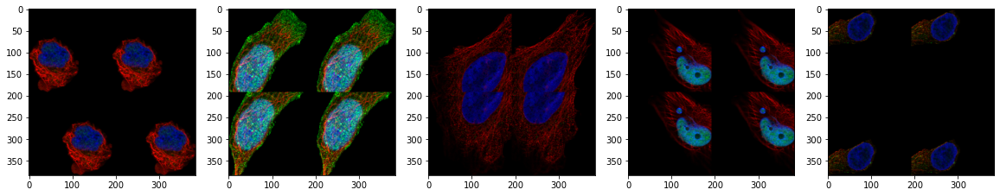

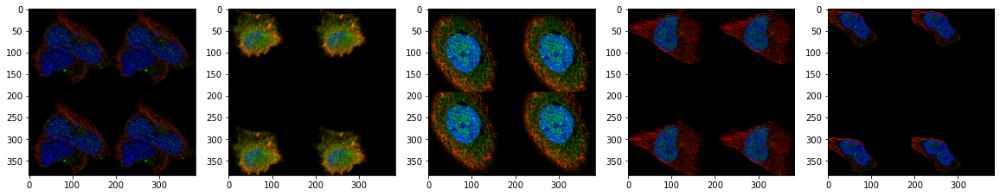

In [34]:
dataset_show = HPATestDataset(test_df, transform=None)
from pylab import rcParams
rcParams['figure.figsize'] = 20,10
for i in range(2):
    f, axarr = plt.subplots(1,5)
    for p in range(5):
        idx = np.random.randint(0, len(dataset_show))
        img = dataset_show[idx]
        img = unnorm(img)[:3,:,:]
        axarr[p].imshow(img.transpose(0, 1).transpose(1,2).squeeze())

In [35]:
dataset1 = HPATestDataset(test_df, transform=None)
loader1 = DataLoader(dataset1, batch_size=batch_size, num_workers=num_workers, shuffle=False)

# loaders = [loader1, loader2, loader3] #TTA
loaders = [loader1]

In [36]:
model_dir = '.'

In [38]:
def load_models(model_files):
    models = []
    for model_f in model_files:
        model_f = os.path.join(model_dir, model_f)
        model = get_model_test()
        model.load_state_dict(torch.load(model_f, map_location=lambda storage, loc: storage), strict=True)
        model.eval()
        model.to(device)
        models.append(model)
        print(f'{model_f} loaded!')
    return models

model_files = []

epoch_eval = 3
for fold in range(nfold):
    seed = fold
    mf = f'{kernel_type}_model_seed_{seed}_fold_{fold}_epoch_{epoch_eval}.pth'
    model_files.append(mf)

models = load_models(model_files)

./bf_6_model_seed_0_fold_0_epoch_3.pth loaded!
./bf_6_model_seed_1_fold_1_epoch_3.pth loaded!
./bf_6_model_seed_2_fold_2_epoch_3.pth loaded!
./bf_6_model_seed_3_fold_3_epoch_3.pth loaded!
./bf_6_model_seed_4_fold_4_epoch_3.pth loaded!


In [39]:
def predict(data, model):
    with torch.no_grad():
        data = data.to(device)
        logits = model(data).detach().sigmoid().cpu()
    return logits

In [40]:
%%time
ALL_TTA = []
for loader in loaders:
    ALL_DATA = []
    for data in tqdm(loader):     
        LOGITS = []
        for model in models:
            logits = predict(data, model)
            LOGITS.append(logits)
        LOGITS = sum(LOGITS) / len(LOGITS)
        ALL_DATA.append(LOGITS)
    ALL_DATA = torch.cat(ALL_DATA)
    ALL_TTA.append(ALL_DATA)
AVG_LOGITS = sum(ALL_TTA) / len(ALL_TTA)

  0%|          | 0/670 [00:00<?, ?it/s]

CPU times: user 2min 43s, sys: 4.86 s, total: 2min 48s
Wall time: 7min 23s


In [41]:
AVG_LOGITS.shape

torch.Size([10716, 19])

In [42]:
with open('logits_gridify2_384_optimized.pickle', 'wb') as handle:
    pickle.dump(AVG_LOGITS, handle)

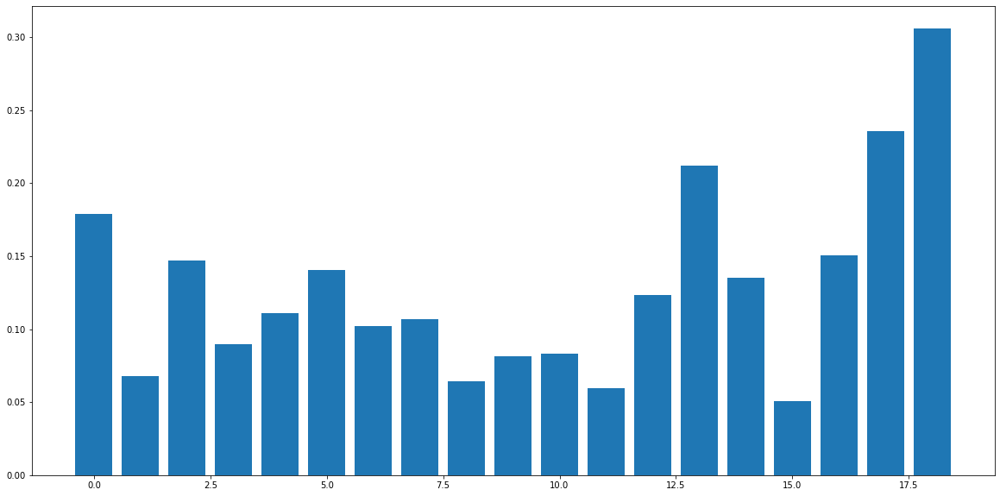

In [43]:
class_means = AVG_LOGITS.mean(dim=0).numpy()
labels = range(19)
plt.bar(labels, class_means)
plt.show()

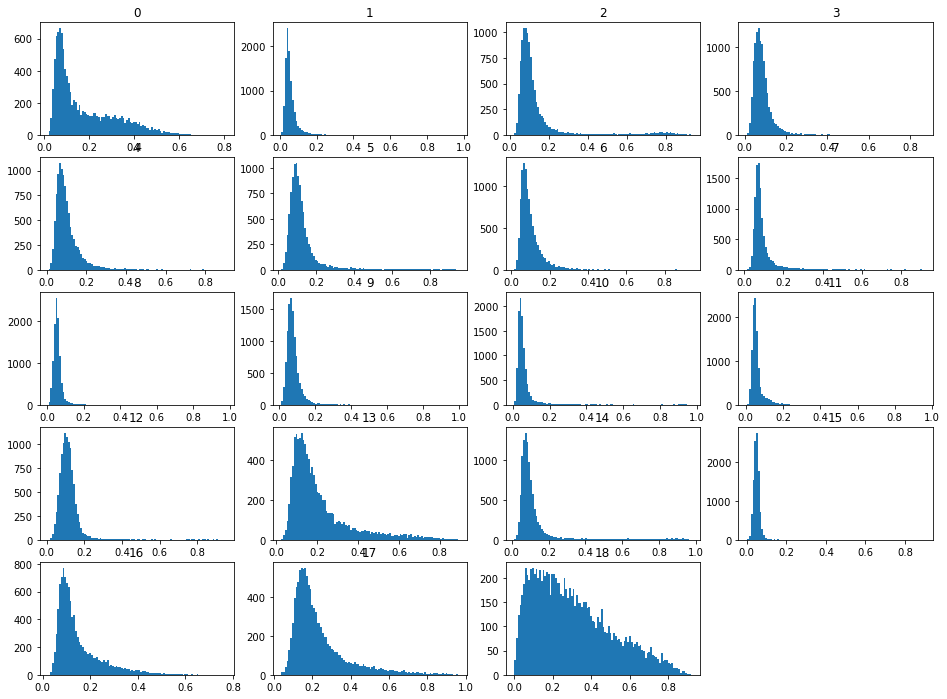

In [44]:
fig = plt.figure(figsize=(16, 12))

for i in labels:
    ax = fig.add_subplot(5,4,i+1)
    ax.hist(AVG_LOGITS[:,i].numpy(), bins=100)
    ax.set_title(i)

plt.show()

In [45]:
top_preds = AVG_LOGITS.argmax(dim=0).tolist()
top_kpreds = (-AVG_LOGITS).argsort(dim=0)[:6]
top30preds = (-AVG_LOGITS).argsort(dim=0)[30:33]
last_preds = (-AVG_LOGITS).argsort(dim=0)[-3:]
othe_preds = torch.cat([top30preds, last_preds], dim=0)
top_kvals = [[AVG_LOGITS[top_kpreds[i,j],j] for i in range(6)] for j in range(19)]
othe_vals = [[AVG_LOGITS[othe_preds[i,j],j] for i in range(6)] for j in range(19)]

In [46]:
HPA_LABEL_NAMES = {
    0: 'Nucleoplasm',
    1: 'Nuclear membrane',
    2: 'Nucleoli',
    3: 'Nucleoli fibrillar center',
    4: 'Nuclear speckles',
    5: 'Nuclear bodies',
    6: 'Endoplasmic reticulum',
    7: 'Golgi apparatus',
    8: 'Intermediate filaments',
    9: 'Actin filaments',
    10: 'Microtubules',
    11: 'Mitotic spindle',
    12: 'Centrosome',
    13: 'Plasma membrane',
    14: 'Mitochondria',
    15: 'Aggresome',
    16: 'Cytosol',
    17: 'Vesicles and punctate cytosolic patterns',
    18: 'Negative'
}

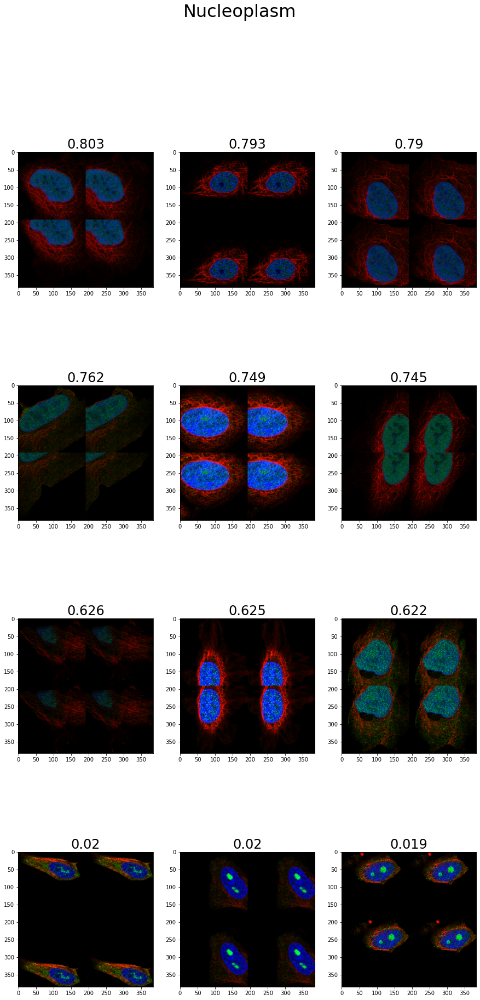

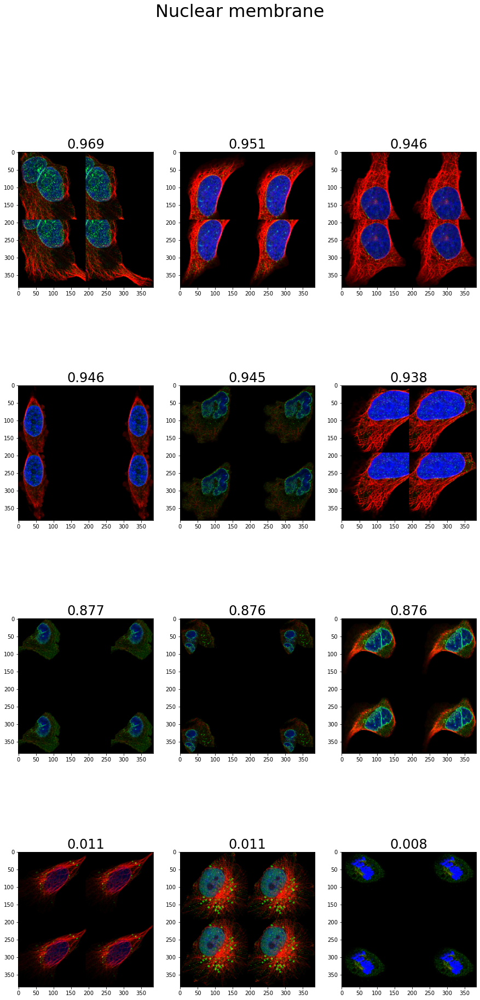

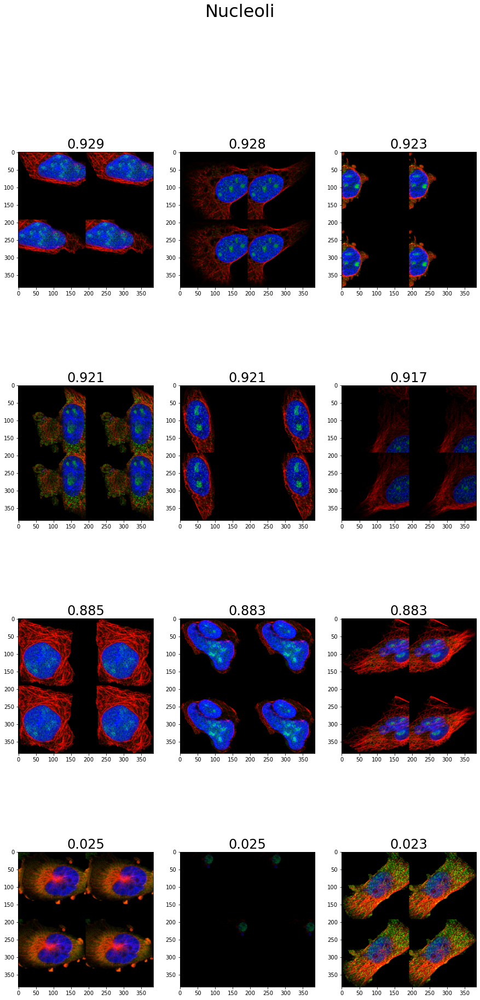

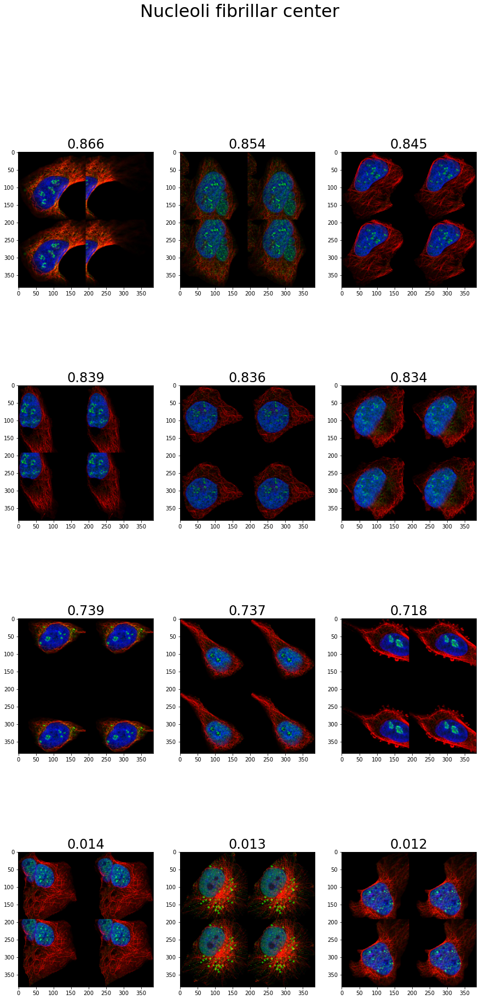

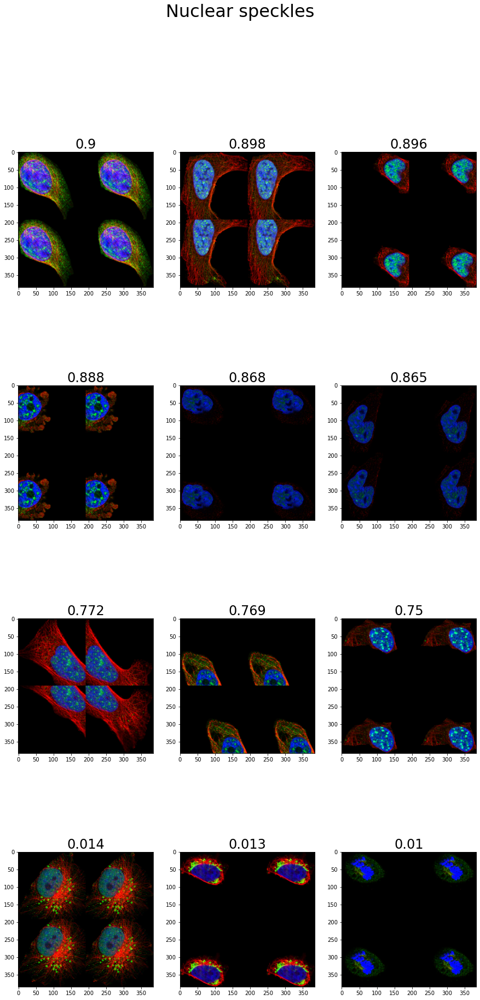

...

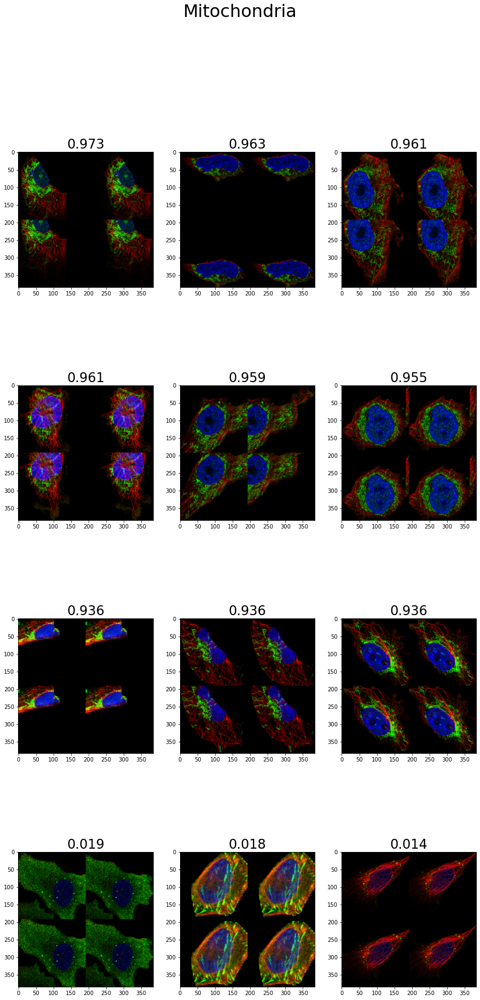

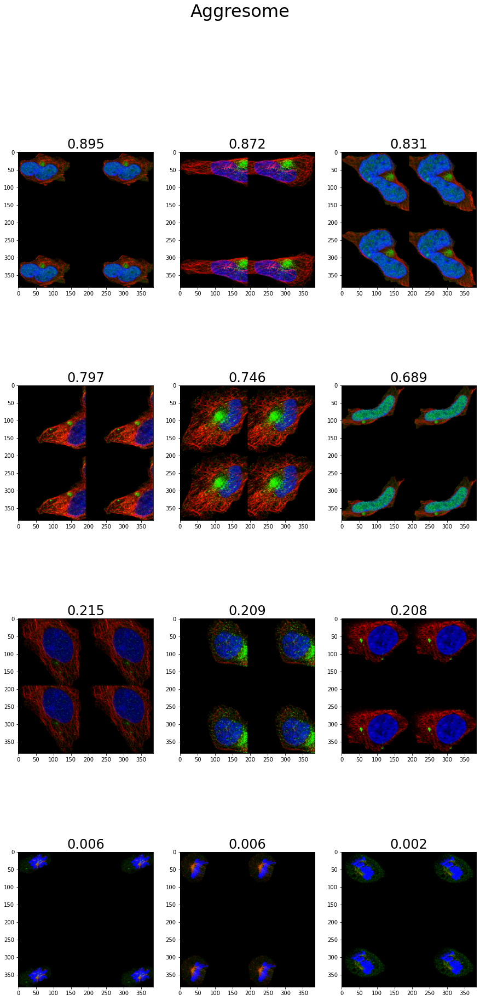

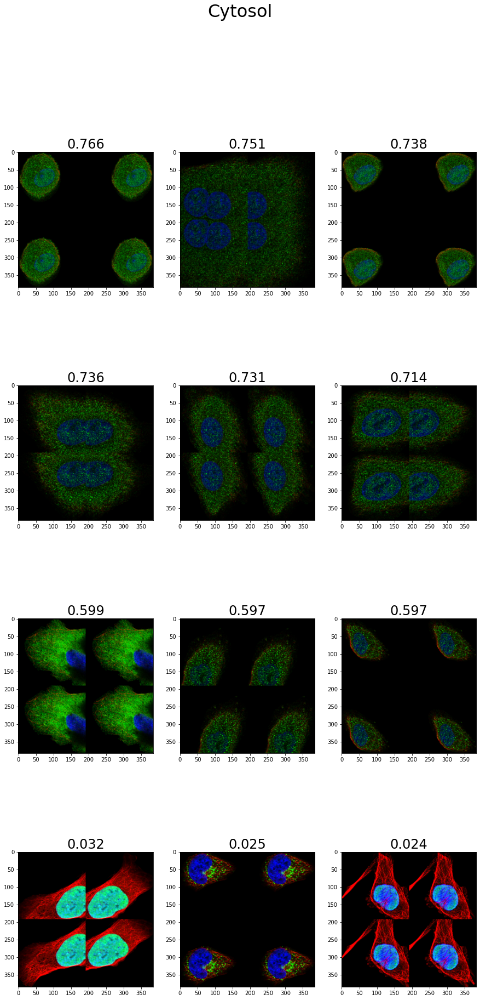

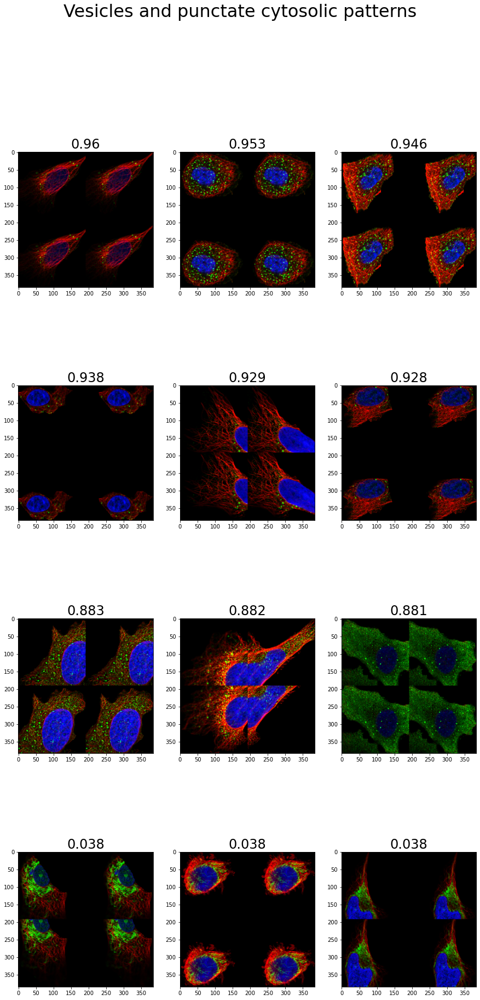

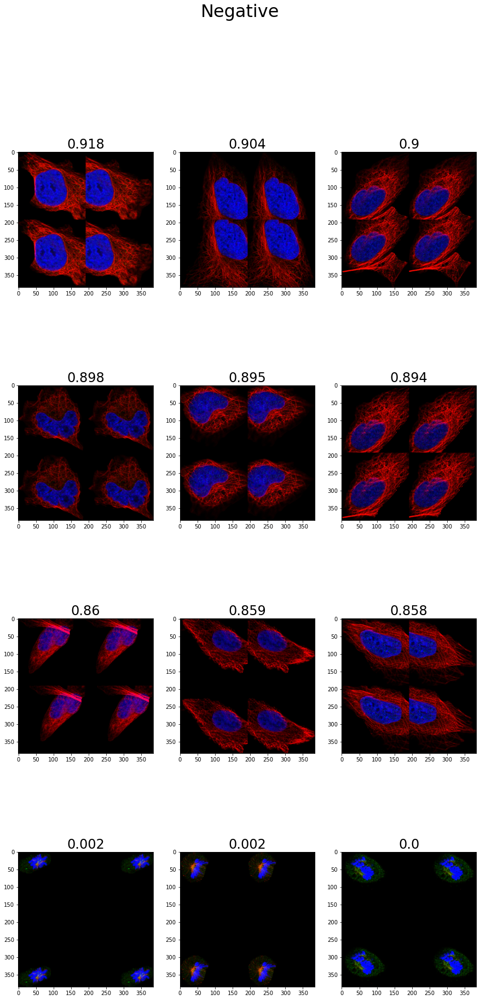

In [47]:
dataset_show = HPATestDataset(test_df, transform=None)
from pylab import rcParams
rcParams['figure.figsize'] = 15,30
rcParams['figure.titlesize'] = 32
rcParams['axes.titlesize'] = 24
rcParams['axes.labelsize'] = 20

for i in range(19):
    f, axarr = plt.subplots(4,3)
    f.suptitle(f'{HPA_LABEL_NAMES[i]}')
    for p in range(3):
        idx = top_kpreds[p,i].item()
        img = dataset_show[idx][:3]
        img = unnorm(img)
        axarr[0,p].imshow(img.transpose(0, 1).transpose(1,2).squeeze())
        axarr[0,p].title.set_text(f'{np.round(top_kvals[i][p].item(), 3)}')
    for p in range(3):
        idx = top_kpreds[p+3,i].item()
        img = dataset_show[idx][:3]
        img = unnorm(img)
        axarr[1,p].imshow(img.transpose(0, 1).transpose(1,2).squeeze())
        axarr[1,p].title.set_text(f'{np.round(top_kvals[i][p+3].item(), 3)}')
    for p in range(3):
        idx = othe_preds[p,i].item()
        img = dataset_show[idx][:3]
        img = unnorm(img)
        axarr[2,p].imshow(img.transpose(0, 1).transpose(1,2).squeeze())
        axarr[2,p].title.set_text(f'{np.round(othe_vals[i][p].item(), 3)}')
    for p in range(3):
        idx = othe_preds[p+3,i].item()
        img = dataset_show[idx][:3]
        img = unnorm(img)
        axarr[3,p].imshow(img.transpose(0, 1).transpose(1,2).squeeze())
        axarr[3,p].title.set_text(f'{np.round(othe_vals[i][p+3].item(), 3)}')

In [50]:
df = pd.read_csv('../sample_submission.csv')
df.head()

,ID,ImageWidth,ImageHeight,PredictionString
0,0040581b-f1f2-4fbe-b043-b6bfea5404bb,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
1,004a270d-34a2-4d60-bbe4-365fca868193,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
2,00537262-883c-4b37-a3a1-a4931b6faea5,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
3,00c9a1c9-2f06-476f-8b0d-6d01032874a2,2048,2048,0 1 eNoLCAgIMAEABJkBdQ==
4,0173029a-161d-40ef-af28-2342915b22fb,3072,3072,0 1 eNoLCAgIsAQABJ4Beg==


In [56]:
df[df.ID == '00537262-883c-4b37-a3a1-a4931b6faea5'].reset_index(drop=True).ImageWidth.loc[0]

2048